## Spot detection and segmentation
Here are two example images were the spots have been detected with plt.contour() function and then segmented using SAM with the centroid of each contour as prompt. In the first image, the dots are well separated and can therefore be detected and segmented. In the second image, there is colocalization between most of the dots, meaning that the light they emit overlap and they become unseparable at the resolution of the images. Sometimes the seperate spots can be guessed from their local maxima but not always. In this kind of image, single spot detection becomes impossible, whereas the spot segmentation would need to be applied to merged spots.

### About light overlap:
- Light intensity is cumulative. When two light sources overlap, their light intensities add together in the overlapping region. This means that the total brightness in that region can appear higher than that of the brightest single source alone.
- The closer the light sources are to each other, the more their light fields will overlap.
- As the distance from the camera to the light sources increases, the light from both sources will converge and appear more uniform
- If the light sources emit diffused light, the overlapping region will gradually merge, creating a more uniform and diffuse bright area.

### What can we detect with the plt tool?
- If we define every spot as a strictly radial light source (without any local min/max) then every seperate peak should be considered a spot unless it is are part of the background noise. However, if two spots are too close they will not be separable because of their overlapping light.
- The size, circularity and z difference level must be tuned such that only spots are found and background noise is disregarded. This can be tricky since some spots may merge and have noise in the upper z levels that could be erroneosly filtered out since they have similar features as noise in background level (small peaks close to each other).
- Can we describe a critical size-intensity-distance level that becomes our resoultion limit with respect to neighbouring spots.
- In very trcky images, it may be hard to tune the tool to find all spots. But it should still work well as a promt generator for SAM.

### Segmentation using SAM
- Once we the centroid of every detected spot, we can use them as prompt for SAM.
- Sam will merge or discard the detected spots, and return several masks with different scores.
- The SAM masks need to be processed to filter out the non relevant masks.
- Spot count should only be performed very carefully on SAM segmented masks, since each mask may contain several merged spots. The count could be estimated based on local maxima or by dividing masks size by an assumed average spot size. 

### Test making fully automated segmentation pipe-line
- We could create GT masks with the plt tool + sam with prompts and train a model to segment without prompts. In that case, the tool would only need an image as input (but it may not perform as well).
- What pre-processing techniques, data augmentation etc to use for generating GT masks? For instance, what about looking at gradients with Sobel operator (first derivative) instead of pixel value. Or Laplacian (second derivative). 

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import tifffile
from skimage import data, feature, color
import plotly.graph_objects as go
import pandas as pd
from segment_anything import SamPredictor, sam_model_registry
import tools
from spot_detection_tool import SpotDetector

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=25):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='o', s=marker_size)#, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='o', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    


def crop(image, x, y, height, width):
    cropped_image = image[y:y+height, x:x+width]
    return cropped_image

def tiff_to_array(tiff_path):
    with tifffile.TiffFile(tiff_path) as tiff:
        image = tiff.asarray() 
    return image
    
def convert_to_8bit(image_16):
    max_value = image_16.max() # normalize with recpect to max value
    min_value = image_16.min() # clip values below min
    #image_8 = ((image_16-min_value)/max_value*255).astype('uint8')
    image_8 = (255.0 * (image_16 - min_value) / (max_value - min_value)).astype(np.uint8)
    return image_8

def plotly_3d_features(image, mask):     
        # make grid for plotting
        x = np.linspace(0, image.shape[1] - 1, image.shape[1])
        y = np.linspace(0, image.shape[0] - 1, image.shape[0])
        x, y = np.meshgrid(x, y)
        points = np.vstack((x.ravel(), y.ravel())).T

        # Create the surface plot for the image
        fig = go.Figure(go.Surface(
            z=image,
            surfacecolor=image,  # Using the image data itself for coloring
            colorscale='gray',   # The primary color scheme
        ))

        # Add overlay using the mask
        masked_data = np.where(mask, image, np.nan)  # Set unmasked areas to NaN
        fig.add_trace(go.Surface(
            z=masked_data,# + 0.01,  # Add a small elevation to avoid z-fighting
            showscale=False            # Do not show the scale for the mask
        ))

        # Update layout to make the z-axis appear flatter
        fig.update_layout(
            title='Masked spot',
            scene=dict(
                xaxis=dict(title='X Axis'),
                yaxis=dict(title='Y Axis'),
                zaxis=dict(title='Intensity', range=[np.min(image), np.max(image)]),  # Adjusting range
                aspectratio=dict(x=1, y=1, z=0.2),  # Flattening the z-axis
            ),
            width=1200,  # Width of the figure
            height=800  # Height of the figure
        )

        fig.show()

def plot_spots(self):     
        spots = self.get_base()
        plt.rcParams['figure.figsize'] = [10, 5] 
        fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout=True)
        axes[0].imshow(self.image, cmap = 'gray')
        axes[1].imshow(self.image, cmap = 'gray')

        for key in spots.keys():
            path = spots[key]['path']
            patch = patches.PathPatch(path, edgecolor='orange', fill=False, lw=1)
            axes[1].add_patch(patch)
        plt.show()

def get_bbox(path):
    # Get the extents of the path
    bounds = path.get_extents()
    # Add padding
    pad = 0
    # Extract the coordinates in xyxy format
    x_min, y_min = bounds.min
    x_max, y_max = bounds.max
    bbox = (x_min-pad, 
            y_min-pad, 
            x_max+pad, 
            y_max+pad)
    return bbox

def find_resets(lst):
    resets = []
    for i in range(1, len(lst)):
        # Detect a reset
        if lst[i] < lst[i-1]:
            resets.append(i-1)
    return resets

In [2]:
# Get image from cellular data set
img = cv2.imread('test_cellular.png',cv2.IMREAD_COLOR)
blur = 3
img_blurred = cv2.GaussianBlur(img, (blur, blur), 0)

In [9]:
# Get SAM model and generate image embeddings
sam = sam_model_registry["vit_l"](checkpoint="sam_vit_l_0b3195.pth")
predictor_1 = SamPredictor(sam)
predictor_1.set_image(img_blurred)

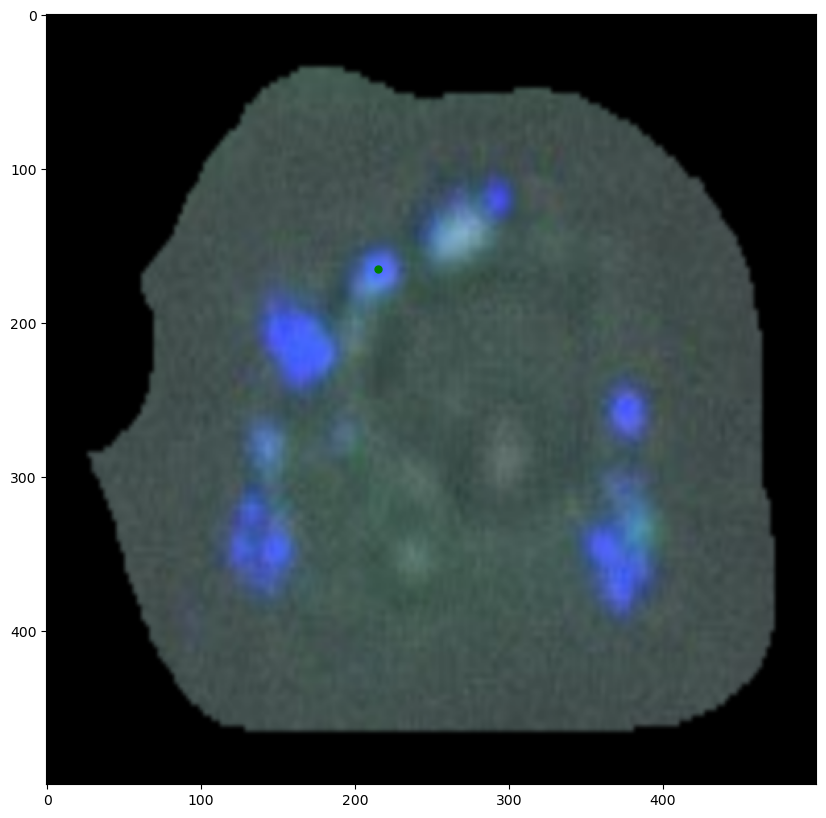

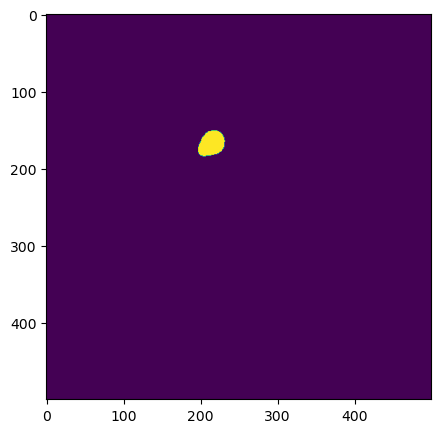

In [10]:
input_point = np.array([[215,165]])
input_label = np.array([1])

plt.figure(figsize=(10,10))
plt.imshow(img_blurred)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

masks, scores, logits = predictor_1.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

plt.imshow(masks[0])

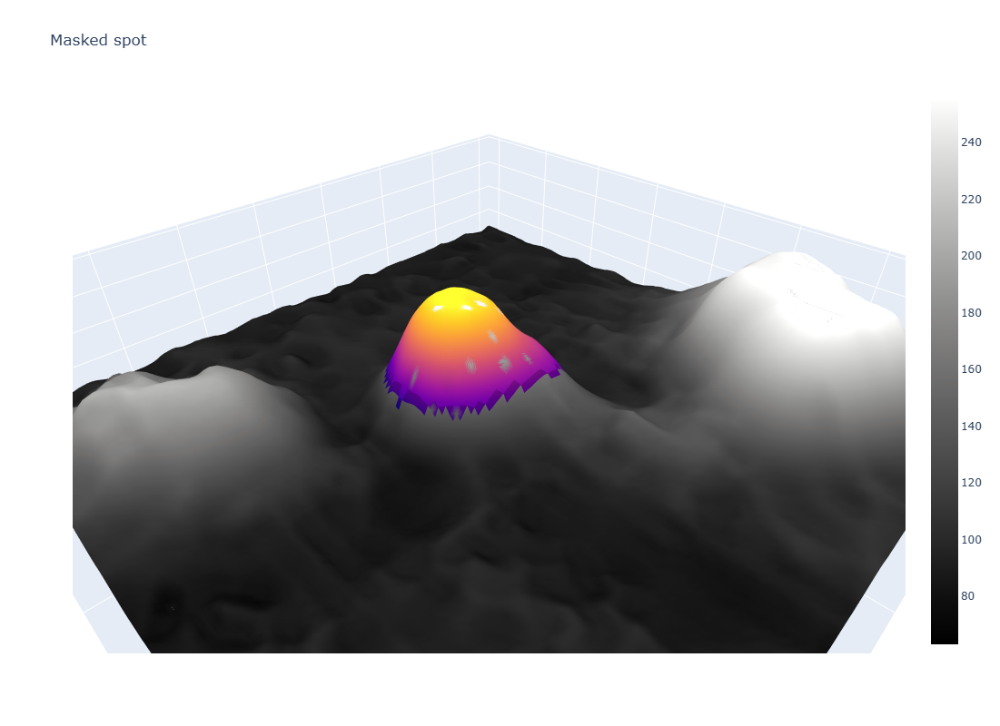

In [11]:
x = 140
y = 100
height = 150
width = 150
cropped_mask =crop(masks[0], x, y, height, width)
cropped_img = crop(img_blurred[:,:,2], x, y, height, width)
plotly_3d_features(cropped_img, cropped_mask)

There are 469 contours
There are 469 contours


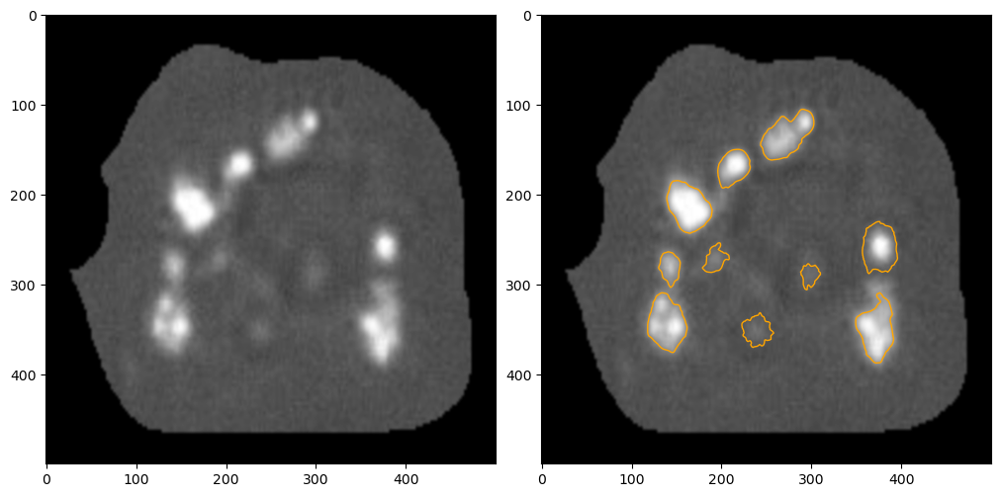

In [3]:
# Spot detection tool need one channel
img_red = img_blurred[:,:,2]

min_area= 120
max_area= 2000
levels = 250
min_z = 200
spots=SpotDetector(img_red,contour_levels=levels, min_area=min_area, max_area=max_area,min_circularity = 0.6, z_min_dist = min_z)
feature_dict=spots.get_features()
plt.close()
spots.plot_spots()

excluding contour: [330 463]
excluding contour: [373 389]
excluding contour: [108 453]
excluding contour: [136 360]
excluding contour: [178 432]


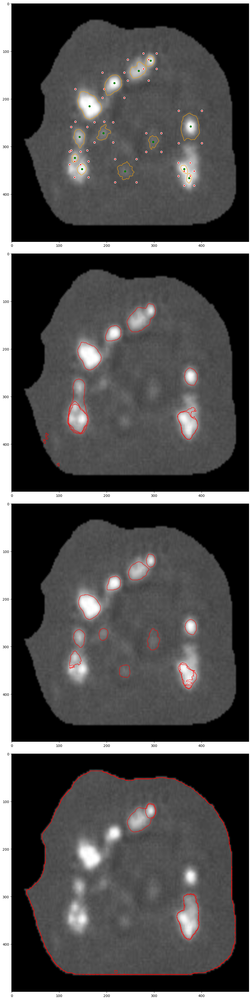

In [15]:
mask = np.zeros(img_red.shape, dtype=bool)
count = 0
plt.rcParams['figure.figsize'] = [10, 40] 
fig, axes = plt.subplots(nrows=4, ncols=1, constrained_layout=True)
axes[0].imshow(img_red, cmap = 'gray')
axes[1].imshow(img_red, cmap = 'gray')
axes[2].imshow(img_red, cmap = 'gray')
axes[3].imshow(img_red, cmap = 'gray')

for feature_nb in feature_dict:
    max_level = len(feature_dict[feature_nb])-1
    local_features = {}

    # not a good way to look for local maxima but does the job on well sorted level lists
    levels = []
    for i in feature_dict[feature_nb]:
        levels.append(feature_dict[feature_nb][i]['level'])

    resets = find_resets(levels)
    local_points = []
    
    for i in resets:
        local_points.append(feature_dict[feature_nb][i]['centroid'])
        
    local_points.append(feature_dict[feature_nb][max_level]['centroid'])
    path= feature_dict[feature_nb][0]['path']
    input_box = np.array(get_bbox(path))

    #Use plt patches to draw contours of base contour 
    patch = patches.PathPatch(path, edgecolor='orange', fill=False, lw=1)
    axes[0].add_patch(patch)
    show_points(input_point, input_label,axes[0] ) # plt.gca())
    #show_box(input_box, axes[0] ) #plt.gca())

    # get negative points and map them to the labels
    dist = 5
    p1 = np.array([input_box[0]- dist, input_box[1]- dist])
    p2 =  np.array([input_box[2]+ dist, input_box[3]+ dist])
    p3 =  np.array([input_box[0]- dist, input_box[3]+ dist])
    p4 =  np.array([input_box[2]+ dist, input_box[1]- dist])

    if len(local_points)>1:
        input_point = np.concatenate((np.array(local_points) , np.array([ p1, p2, p3, p4])))
        local_labels = np.ones(len(local_points))
        input_label = np.concatenate((local_labels , np.array([0, 0, 0, 0])))

    else:
        input_point = np.array([feature_dict[feature_nb][max_level]['centroid'], p1, p2, p3, p4])
        input_label = np.array([1, 0, 0, 0, 0])
        
    new_mask, scores, logits = predictor_1.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )
    
    # Plot contours of mask
    score_1 = np.uint8(new_mask[0,:,:]*1)
    contours, _ = cv2.findContours(score_1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    contour = np.vstack([contour, contour[0]]) # close contours
    axes[1].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)

    score_2 = np.uint8(new_mask[1,:,:]*1)
    contours, _ = cv2.findContours(score_2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()

    if contour[1].shape ==(2,):  
        contour = np.vstack([contour, contour[0]]) # close contours
        axes[2].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        
    else: 
        print(f'excluding contour: {contour}')

    score_3 = np.uint8(new_mask[2,:,:]*1)
    contours, _ = cv2.findContours(score_3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    if contour[1].shape ==(2,):
        contour = np.vstack([contour, contour[0]]) # close contours
        axes[3].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)

    else:
        print(f'excluding contour: {contour}')
    # Update mask image for later use
    mask = mask + new_mask

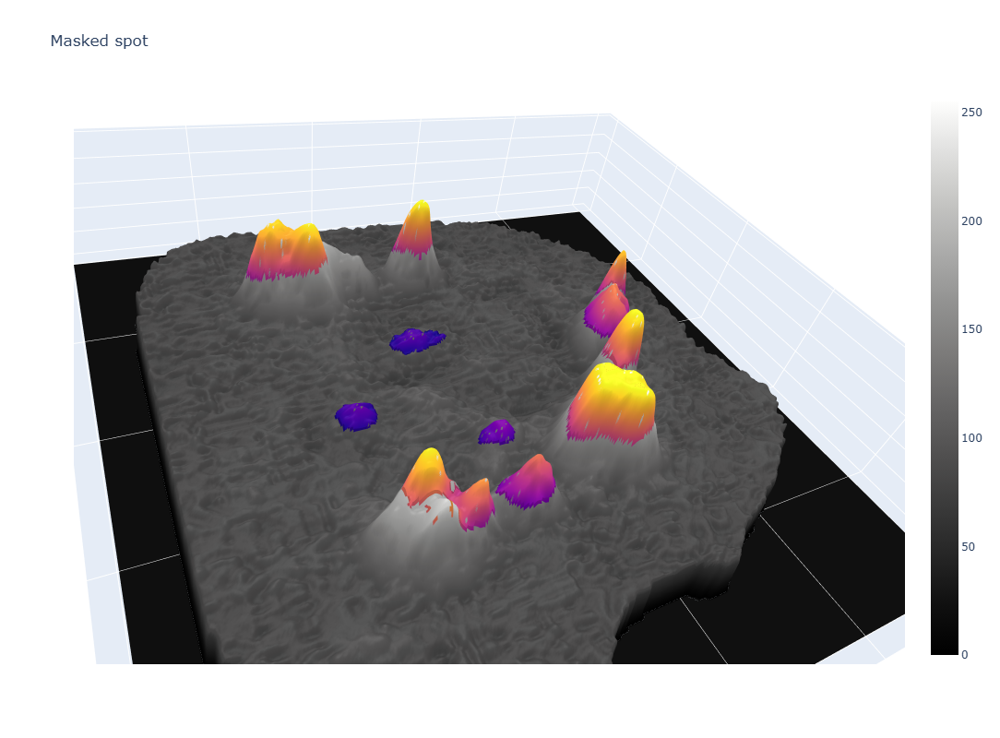

In [9]:
sam_masks = mask[1,:,:]

plotly_3d_features(img_red, sam_masks)

### A more tricky image

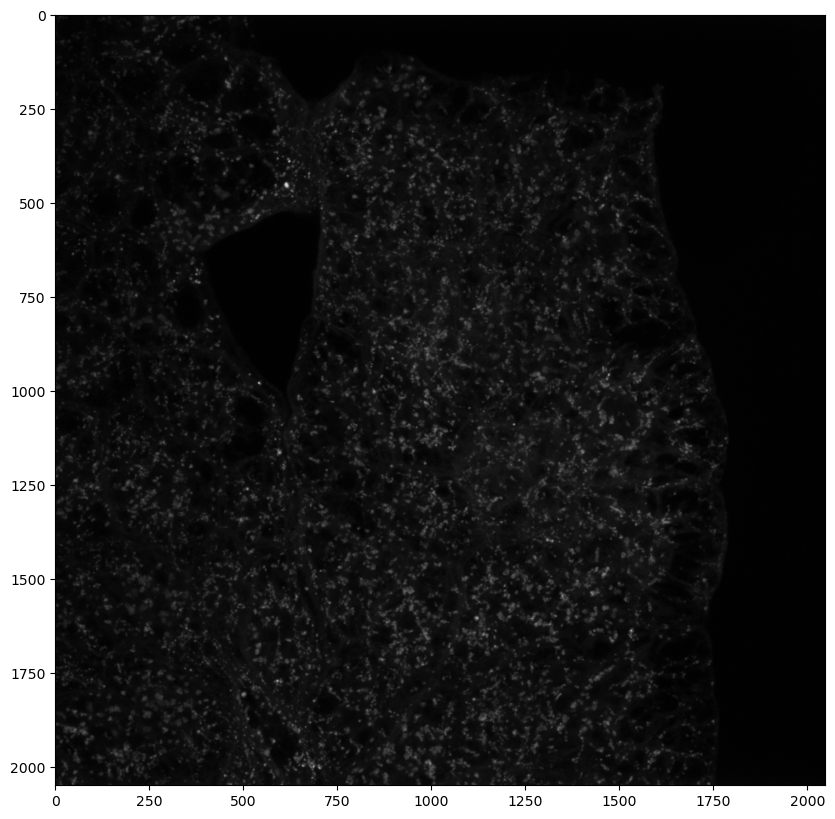

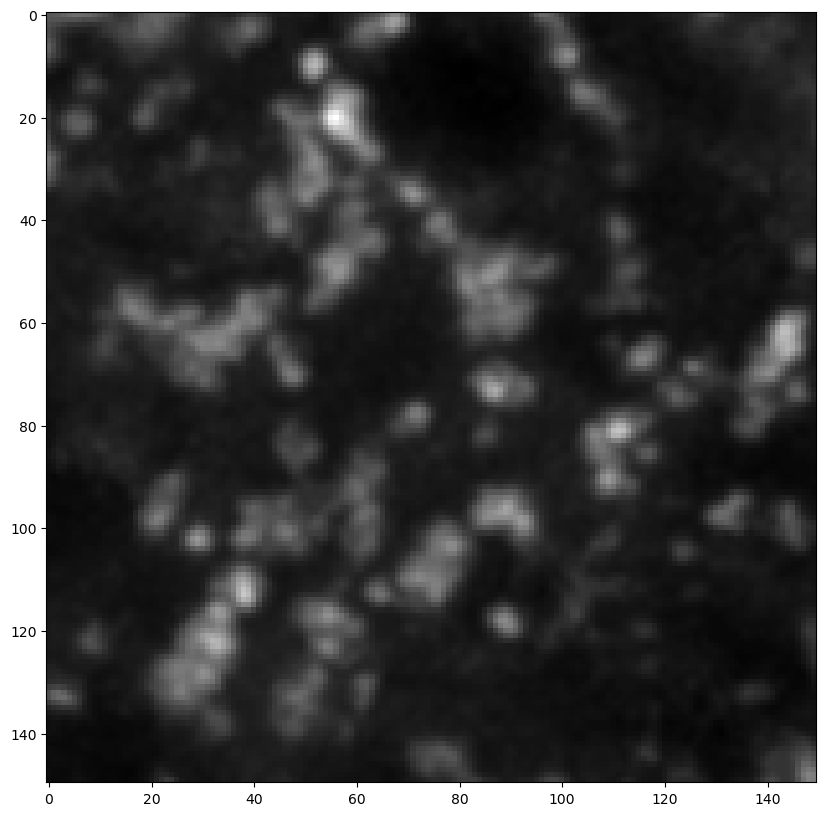

In [4]:
# get example image with only one mutant cell
image_name = 'test_544.tif'
img = tiff_to_array(image_name)
img_red = img[2,:,:]

plt.rcParams['figure.figsize'] = [10, 10] 
blur = 3
img_red = cv2.GaussianBlur(img_red, (blur, blur), 0)
plt.imshow(img_red, cmap='gray')
plt.show()
img_cropped = crop(img_red,950, 1250, 150, 150)
plt.imshow(img_cropped, cmap='gray')

In [6]:
#Convert to 8 bit for using with sam
img_8bit= convert_to_8bit(img_cropped)
array_3d = np.stack((img_8bit, img_8bit, img_8bit), axis=-1)

sam = sam_model_registry["vit_l"](checkpoint="sam_vit_l_0b3195.pth")
predictor = SamPredictor(sam)
predictor.set_image(array_3d)

There are 3326 contours


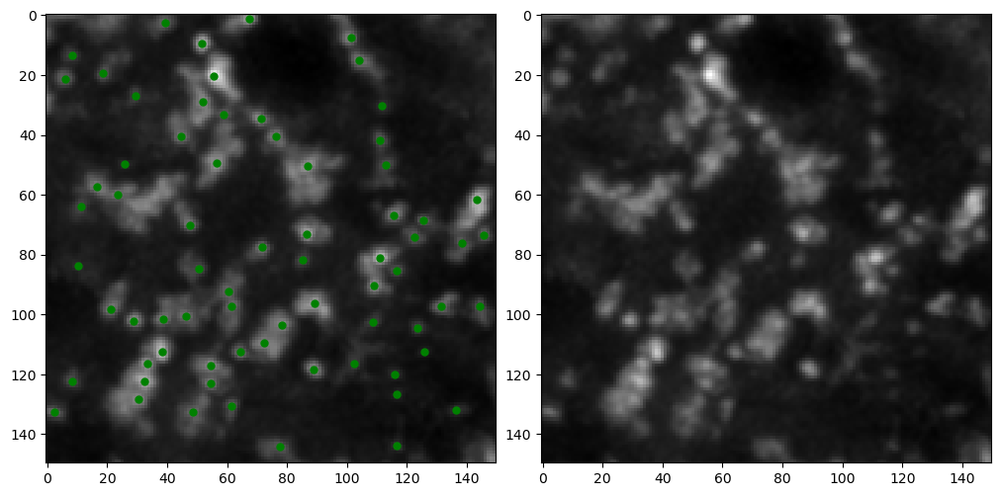

In [8]:

min_area= 2
max_area= 2000
levels = 250
min_z = 10
spots=SpotDetector(img_cropped,contour_levels=levels, min_area=min_area, max_area=max_area,min_circularity = 0.1, z_min_dist = min_z)
all_dict=spots.get_features()
feature_dict = spots.check_z_distance(all_dict)
plt.close()


count = 0
plt.rcParams['figure.figsize'] = [10, 20] 
fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout=True)
axes[0].imshow(array_3d, cmap = 'gray')
axes[1].imshow(array_3d, cmap = 'gray')


for feature_nb in feature_dict:
    max_level = len(feature_dict[feature_nb])-1
    local_features = {}

    # not a good way to look for local maxima but does the job on well sorted level lists
    levels = []
    for i in feature_dict[feature_nb]:
        levels.append(feature_dict[feature_nb][i]['level'])

    resets = find_resets(levels)
    local_points = []
    
    for i in resets:
        local_points.append(feature_dict[feature_nb][i]['centroid'])
        
    local_points.append(feature_dict[feature_nb][max_level]['centroid'])
    path= feature_dict[feature_nb][0]['path']
    input_box = np.array(get_bbox(path))

    # get negative points and map them to the labels
    dist = 0
    p1 = np.array([input_box[0]- dist, input_box[1]- dist])
    p2 =  np.array([input_box[2]+ dist, input_box[3]+ dist])
    p3 =  np.array([input_box[0]- dist, input_box[3]+ dist])
    p4 =  np.array([input_box[2]+ dist, input_box[1]- dist])

    if len(local_points)>1:
        input_point = np.array(local_points)
        local_labels = np.ones(len(local_points))
        input_label = local_labels

    else:
        input_point = np.array([feature_dict[feature_nb][max_level]['centroid']])
        input_label = np.array([1])

    #Use plt patches to draw contours of base contour 
    #patch = patches.PathPatch(path, edgecolor='orange', fill=False, lw=1)
    #axes[0].add_patch(patch)
    show_points(input_point, input_label,axes[0] ) # plt.gca())


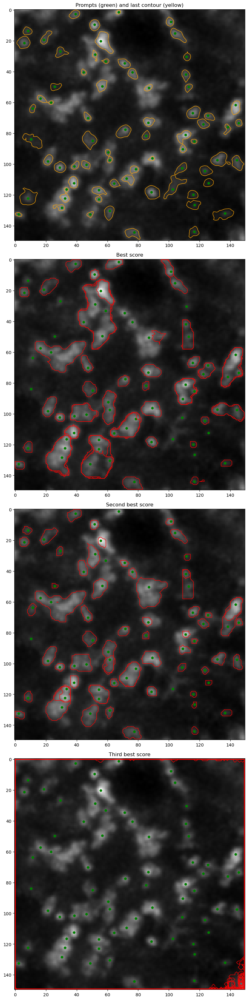

In [9]:
mask = np.zeros(img_cropped.shape, dtype=bool)
count = 0
plt.rcParams['figure.figsize'] = [8, 32] 
fig, axes = plt.subplots(nrows=4, ncols=1, constrained_layout=True)
axes[0].imshow(array_3d, cmap = 'gray')
axes[1].imshow(array_3d, cmap = 'gray')
axes[2].imshow(array_3d, cmap = 'gray')
axes[3].imshow(array_3d, cmap = 'gray')

for feature_nb in feature_dict:
    max_level = len(feature_dict[feature_nb])-1
    local_features = {}

    # not a good way to look for local maxima but does the job on well sorted level lists
    levels = []
    for i in feature_dict[feature_nb]:
        levels.append(feature_dict[feature_nb][i]['level'])

    resets = find_resets(levels)
    local_points = []
    
    for i in resets:
        local_points.append(feature_dict[feature_nb][i]['centroid'])
        
    local_points.append(feature_dict[feature_nb][max_level]['centroid'])
    path= feature_dict[feature_nb][0]['path']
    input_box = np.array(get_bbox(path))

    # get negative points and map them to the labels
    dist = 0
    p1 = np.array([input_box[0]- dist, input_box[1]- dist])
    p2 =  np.array([input_box[2]+ dist, input_box[3]+ dist])
    p3 =  np.array([input_box[0]- dist, input_box[3]+ dist])
    p4 =  np.array([input_box[2]+ dist, input_box[1]- dist])

    if len(local_points)>1:
        #input_point = np.concatenate((np.array(local_points) , np.array([ p1, p2, p3, p4]))) 
        # test without neg points
        input_point = np.array(local_points)
        local_labels = np.ones(len(local_points))
        #input_label = np.concatenate((local_labels , np.array([0, 0, 0, 0])))
        # test without neg points
        input_label = local_labels

    else:
        #input_point = np.array([feature_dict[feature_nb][max_level]['centroid'], p1, p2, p3, p4])
        input_point = np.array([feature_dict[feature_nb][max_level]['centroid']])
        #input_label = np.array([1, 0, 0, 0, 0])
        input_label = np.array([1])

    #Use plt patches to draw contours of base contour 
    patch = patches.PathPatch(path, edgecolor='orange', fill=False, lw=1)
    axes[0].add_patch(patch)
    axes[0].set_title('Prompts (green) and last contour (yellow)')
    
    show_points(input_point, input_label,axes[0] ) # plt.gca())
    show_points(input_point, input_label,axes[1] )
    show_points(input_point, input_label,axes[2] )
    show_points(input_point, input_label,axes[3] )
    #show_box(input_box, axes[0] ) #plt.gca())

    new_mask, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        #mask_input=input_box,
        multimask_output=True,
    )
    
    # Plot contours of mask
    score_1 = np.uint8(new_mask[0,:,:]*1)
    contours, _ = cv2.findContours(score_1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    if contour[1].shape ==(2,):
        contour = np.vstack([contour, contour[0]])
        axes[1].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[1].set_title('Best score')
    # else: 
    #     print(f'excluding contour: {contour}')

    score_2 = np.uint8(new_mask[1,:,:]*1)
    contours, _ = cv2.findContours(score_2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()

    if contour[1].shape ==(2,):    
        contour = np.vstack([contour, contour[0]])
        axes[2].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[2].set_title('Second best score')
        #show_mask(score_2, axes[2], random_color=False)
    # else: 
    #     print(f'excluding contour: {contour}')

    score_3 = np.uint8(new_mask[2,:,:]*1)
    contours, _ = cv2.findContours(score_3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    if contour[1].shape ==(2,):
        contour = np.vstack([contour, contour[0]]) # close contours
        axes[3].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[3].set_title('Third best score')
        
    # else:
    #     print(f'excluding contour: {contour}')
    # Update mask image for later use
    mask = mask + new_mask

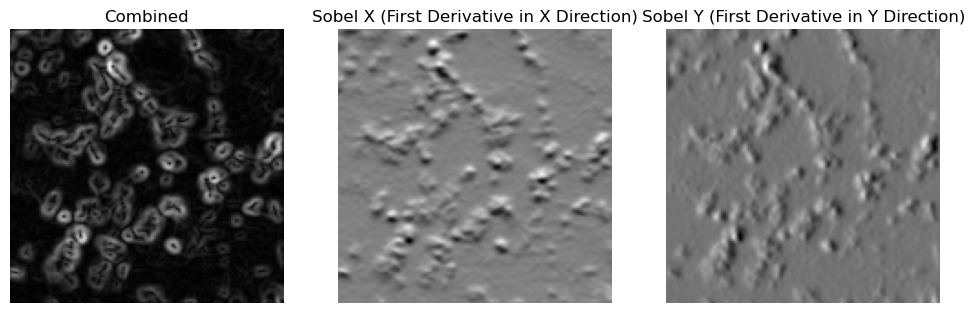

In [10]:

from PIL import Image
from scipy.ndimage import sobel

image_name = 'test_544.tif'
img = tiff_to_array(image_name)
img = img[2,:,:]
img = crop(img_red,950, 1250, 150, 150)

blur = 1
img_blurred = cv2.GaussianBlur(img, (blur, blur), 0)
img_cropped = img_blurred.astype('int32')

# Step 3: Compute the first derivatives (Sobel filter)
sobel_x = sobel(img_cropped, axis=0)
sobel_y = sobel(img_cropped, axis=1)

# Compute the gradient magnitude
gradient_magnitude = np.hypot(sobel_x, sobel_y)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title('Combined')
plt.imshow(gradient_magnitude, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Sobel X (First Derivative in X Direction)')
plt.imshow(sobel_x, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Sobel Y (First Derivative in Y Direction)')
plt.imshow(sobel_y, cmap='gray')
plt.axis('off')

plt.show()


min_area= 2
max_area= 2000
levels = 100
min_z = 2

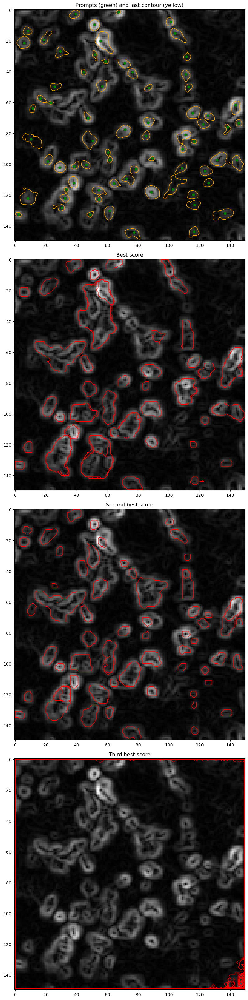

In [11]:
mask = np.zeros(img_cropped.shape, dtype=bool)
count = 0
plt.rcParams['figure.figsize'] = [8, 32] 
fig, axes = plt.subplots(nrows=4, ncols=1, constrained_layout=True)
axes[0].imshow(gradient_magnitude, cmap = 'gray')
axes[1].imshow(gradient_magnitude, cmap = 'gray')
axes[2].imshow(gradient_magnitude, cmap = 'gray')
axes[3].imshow(gradient_magnitude, cmap = 'gray')

for feature_nb in feature_dict:
    max_level = len(feature_dict[feature_nb])-1
    local_features = {}

    # not a good way to look for local maxima but does the job on well sorted level lists
    levels = []
    for i in feature_dict[feature_nb]:
        levels.append(feature_dict[feature_nb][i]['level'])

    resets = find_resets(levels)
    local_points = []
    
    for i in resets:
        local_points.append(feature_dict[feature_nb][i]['centroid'])
        
    local_points.append(feature_dict[feature_nb][max_level]['centroid'])
    path= feature_dict[feature_nb][0]['path']
    input_box = np.array(get_bbox(path))

    # get negative points and map them to the labels
    dist = 0
    p1 = np.array([input_box[0]- dist, input_box[1]- dist])
    p2 =  np.array([input_box[2]+ dist, input_box[3]+ dist])
    p3 =  np.array([input_box[0]- dist, input_box[3]+ dist])
    p4 =  np.array([input_box[2]+ dist, input_box[1]- dist])

    if len(local_points)>1:
        #input_point = np.concatenate((np.array(local_points) , np.array([ p1, p2, p3, p4]))) 
        # test without neg points
        input_point = np.array(local_points)
        local_labels = np.ones(len(local_points))
        #input_label = np.concatenate((local_labels , np.array([0, 0, 0, 0])))
        # test without neg points
        input_label = local_labels

    else:
        #input_point = np.array([feature_dict[feature_nb][max_level]['centroid'], p1, p2, p3, p4])
        input_point = np.array([feature_dict[feature_nb][max_level]['centroid']])
        #input_label = np.array([1, 0, 0, 0, 0])
        input_label = np.array([1])

    #Use plt patches to draw contours of base contour 
    patch = patches.PathPatch(path, edgecolor='orange', fill=False, lw=1)
    axes[0].add_patch(patch)
    axes[0].set_title('Prompts (green) and last contour (yellow)')
    show_points(input_point, input_label,axes[0] ) # plt.gca())
    #show_box(input_box, axes[0] ) #plt.gca())

    new_mask, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        #mask_input=input_box,
        multimask_output=True,
    )
    
    # Plot contours of mask
    score_1 = np.uint8(new_mask[0,:,:]*1)
    contours, _ = cv2.findContours(score_1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    if contour[1].shape ==(2,):
        contour = np.vstack([contour, contour[0]])
        axes[1].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[1].set_title('Best score')

    score_2 = np.uint8(new_mask[1,:,:]*1)
    contours, _ = cv2.findContours(score_2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()

    if contour[1].shape ==(2,):    
        contour = np.vstack([contour, contour[0]])
        axes[2].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[2].set_title('Second best score')

    score_3 = np.uint8(new_mask[2,:,:]*1)
    contours, _ = cv2.findContours(score_3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = contours[0].squeeze()
    if contour[1].shape ==(2,):
        contour = np.vstack([contour, contour[0]]) # close contours
        axes[3].plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
        axes[3].set_title('Third best score')
    mask = mask + new_mask